In [1]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [2]:
# pip install git+https://github.com/rwalk/gsdmm.git

In [3]:
from gsdmm import MovieGroupProcess

In [4]:
df = pd.read_csv("sentiment_labelled_india_SGD.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,1
1,11,11,خود کو اور اپنے پیاروں کو کورونا وبا سے بچانے ...,خود کو اور اپنے پیاروں کو کورونا وبا سے بچانے ...,"URDU, Unknown",Vaccinate to protect yourself and your loved o...,ENGLISH,"[('vaccinate', 'NN'), ('to', 'TO'), ('protect'...","['vaccinate', 'protect', 'loved_one', 'coronav...","['uranus', 'covidvaccination']",['covidvaccination'],subjective,1
2,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,1
3,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
4,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43458,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
43459,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,1
43460,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
43461,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,1


In [5]:
df.drop(columns = ['Unnamed: 0', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words', 'words_processed_all','words_processed_noun_adj_verb_adv'], inplace = True)
df

,Text,translated,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,['death'],subjective,1
1,خود کو اور اپنے پیاروں کو کورونا وبا سے بچانے ...,Vaccinate to protect yourself and your loved o...,['covidvaccination'],subjective,1
2,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,"['hair', 'ply', 'vaccination']",subjective,1
3,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
4,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,"['necessity', 'today', 'scenario', 'problem']",subjective,2
...,...,...,...,...,...
43458,nature seems have already started working savi...,nature seems have already started working savi...,"['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
43459,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,1
43460,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,"['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
43461,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'feedback', 'vaccine...",subjective,1


In [6]:
df['words_processed_noun'].values[0][0]

'['

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [8]:
tokens_words_processed_noun = list(sent_to_words(df['words_processed_noun']))

In [9]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
stop_words = ['vaccine', 'vaccines','vaccination', 'covidvaccine', 'vaccinate', 'vaccinated', 'amp', 'couid', 
             'covishield', 'people', 'country', 'pfizer', 'hour', 'year', 'month', 'time', 'day', 'covid',
             'yesterday', 'thing', 'sir', 'today', 'retweet', 'corona', 'one', 'love', 'coronavirus', 
              'ahmedabad', 'person', 'week', 'other', 'today', 'use', 'part', 'covidvaccination', 
             'thank', 'crore', 'thing', 'twentynine', 'need', 'lot','people','covidvaccine','moderna','astrazaneca']
stop_list.extend(stop_words)

test_words_only1 = ['not', 'vaccine', 'covid', 'and', 'vegan', 'cruelty', 'free', 'i', 'use', 'elf', 'cosmetics', 'every', 'day', 'and', 'i', 'love', 'it']
test_stopremoved = [w for w in test_words_only1 if w not in stop_list or w == 'not']
print(test_stopremoved)

['not', 'vegan', 'cruelty', 'free', 'elf', 'cosmetics', 'every']


In [10]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [11]:
df['words_processed_noun'] = tokens_words_processed_noun

In [12]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_noun]
tokenised_stopremoved

[['death'],
 [],
 ['hair', 'ply'],
 ['death', 'rate', 'harm', 'harm'],
 ['necessity', 'scenario', 'problem'],
 ['population',
  'yrs',
  'offline',
  'class',
  'examination',
  'situation',
  'safety',
  'class',
  'examination'],
 ['way', 'millennium', 'peril', 'job', 'process'],
 ['symptom', 'example', 'number', 'death', 'population', 'life'],
 ['follower', 'pledge', 'service', 'humanity'],
 ['case', 'case', 'testing', 'taboo'],
 ['intellectual',
  'education',
  'leader',
  'health',
  'system',
  'pandemic',
  'nation',
  'service'],
 ['memory', 'post', 'post', 'forgetting', 'memory', 'couple'],
 ['agreement', 'student', 'travel', 'guideline'],
 ['system',
  'conversion',
  'appeasement',
  'health',
  'service',
  'infection',
  'rate',
  'death',
  'rate',
  'rate',
  'welfare',
  'isis'],
 ['personnel', 'unitedstate'],
 ['oppression', 'appointment', 'wife', 'worker', 'present', 'money'],
 ['oppression', 'appointment', 'wife', 'center', 'worker'],
 ['result',
  'effect',
  'exer

In [13]:
df['words_processed_noun'].values[0][0]

'death'

In [14]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43463 entries, 0 to 43462
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Text                   43463 non-null  object
 1   translated             43463 non-null  object
 2   words_processed_noun   43463 non-null  object
 3   text_type              43463 non-null  object
 4   sentiment              43463 non-null  int64 
 5   tokenised_stopremoved  43463 non-null  object
dtypes: int64(1), object(5)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [21]:
np.random.seed(0)

In [22]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43463 entries, 0 to 43462
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Text                   43463 non-null  object
 1   translated             43463 non-null  object
 2   words_processed_noun   43463 non-null  object
 3   text_type              43463 non-null  object
 4   sentiment              43463 non-null  int64 
 5   tokenised_stopremoved  43463 non-null  object
dtypes: int64(1), object(5)
memory usage: 2.0+ MB


In [23]:
tokenised_lemmatized = list(sent_to_words(df['tokenised_stopremoved']))

In [24]:
tokenised_lemmatized[0][0]

'death'

In [25]:
len(tokenised_lemmatized)

43463

In [31]:
tokenised_lemmatized

[['death'],
 [],
 ['hair', 'ply'],
 ['death', 'rate', 'harm', 'harm'],
 ['necessity', 'scenario', 'problem'],
 ['population',
  'yrs',
  'offline',
  'class',
  'examination',
  'situation',
  'safety',
  'class',
  'examination'],
 ['way', 'millennium', 'peril', 'job', 'process'],
 ['symptom', 'example', 'number', 'death', 'population', 'life'],
 ['follower', 'pledge', 'service', 'humanity'],
 ['case', 'case', 'testing', 'taboo'],
 ['intellectual',
  'education',
  'leader',
  'health',
  'system',
  'pandemic',
  'nation',
  'service'],
 ['memory', 'post', 'post', 'forgetting', 'memory', 'couple'],
 ['agreement', 'student', 'travel', 'guideline'],
 ['system',
  'conversion',
  'appeasement',
  'health',
  'service',
  'infection',
  'rate',
  'death',
  'rate',
  'rate',
  'welfare',
  'isis'],
 ['personnel', 'unitedstate'],
 ['oppression', 'appointment', 'wife', 'worker', 'present', 'money'],
 ['oppression', 'appointment', 'wife', 'center', 'worker'],
 ['result',
  'effect',
  'exer

In [26]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 6

In [27]:
import datetime
print(datetime.datetime.now())

from gensim.models import CoherenceModel
model_list = []
# perplexity_values = []
model_topics = []
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)
vocab = set(x for review in tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(tokenised_lemmatized, n_terms)
model_topics.append(6)
model_list.append(model)
# perplexity_values.append(gsdmm_x.perplexity(sg_vecs))
print("#Topics: 6")
print(datetime.datetime.now())

2022-03-29 21:58:26.685234
In stage 0: transferred 34619 clusters with 6 clusters populated
In stage 1: transferred 28497 clusters with 6 clusters populated
In stage 2: transferred 24874 clusters with 6 clusters populated
In stage 3: transferred 22103 clusters with 6 clusters populated
In stage 4: transferred 20009 clusters with 6 clusters populated
In stage 5: transferred 18872 clusters with 6 clusters populated
In stage 6: transferred 17972 clusters with 6 clusters populated
In stage 7: transferred 17325 clusters with 6 clusters populated
In stage 8: transferred 17132 clusters with 6 clusters populated
In stage 9: transferred 16889 clusters with 6 clusters populated
In stage 10: transferred 16485 clusters with 6 clusters populated
In stage 11: transferred 16273 clusters with 6 clusters populated
In stage 12: transferred 16070 clusters with 6 clusters populated
In stage 13: transferred 15911 clusters with 6 clusters populated
In stage 14: transferred 15709 clusters with 6 clusters pop

In [30]:
mgp.score(["my", "beautiful", "text", "is", "here"])

[0.011660073654666482,
 0.089750814114164,
 0.0004427430760027836,
 0.011230906239117891,
 0.09580955734214353,
 0.7911059055739054]

In [32]:
scores = []

In [33]:
for a_tweet in tokenised_lemmatized:
    score = mgp.score(a_tweet)
    scores.append(score)

In [34]:
scores

[[0.7054122558213425,
  0.03344201385063569,
  0.21680278506076944,
  0.0070728782824630255,
  0.028265098659119164,
  0.009004968325670087],
 [0.28118011393441883,
  0.05158569469625159,
  0.2505337799906129,
  0.1051707635814797,
  0.22435095114072462,
  0.08717869665651252],
 [0.2292236521040081,
  0.21683968060446915,
  0.07548208591337174,
  0.27984543527148753,
  0.18045966178925424,
  0.018149484317409155],
 [0.9962167018204203,
  0.00041304697939235007,
  0.0031871890605928493,
  0.00011067553930317663,
  5.356819342712775e-05,
  1.8818406864097916e-05],
 [0.4833683256373094,
  0.001767084791925705,
  0.49324090666257026,
  0.0017112110611598047,
  0.01695131594861407,
  0.0029611558984207046],
 [2.037789450592516e-13,
  0.9999999653253568,
  1.7616134602375762e-08,
  1.7032863047334107e-08,
  2.5440294000128636e-11,
  1.5626114311903825e-15],
 [0.0023217467095942535,
  0.005637130541743162,
  0.66982813157375,
  0.004526742307074428,
  0.3176127334837886,
  7.351538404957165e-

In [36]:
topicnames = ["Topic" + str(i) for i in range(6)]

In [38]:
docnames = ["Doc" + str(i) for i in range(len(tokenised_lemmatized))]

In [39]:
df_document_topic = pd.DataFrame(np.round(scores, 5), columns=topicnames, index=docnames)

In [40]:
# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

In [63]:
# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
num_doc_to_show = 50  # change this to display the number of documents shown below
df_document_topics = df_document_topic.head(num_doc_to_show).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,dominant_topic
Doc0,0.705410,0.033440,0.216800,0.007070,0.028270,0.009000,0
Doc1,0.281180,0.051590,0.250530,0.105170,0.224350,0.087180,0
Doc2,0.229220,0.216840,0.075480,0.279850,0.180460,0.018150,3
Doc3,0.996220,0.000410,0.003190,0.000110,0.000050,0.000020,0
Doc4,0.483370,0.001770,0.493240,0.001710,0.016950,0.002960,2
Doc5,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1
Doc6,0.002320,0.005640,0.669830,0.004530,0.317610,0.000070,2
Doc7,0.998580,0.000420,0.000800,0.000000,0.000190,0.000000,0
Doc8,0.025350,0.000000,0.912890,0.000310,0.061440,0.000000,2
Doc9,0.228210,0.183190,0.010940,0.562850,0.004300,0.010500,3


In [43]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [12221  2242 10889  4571  9751  3789]

Most important clusters (by number of docs inside): [0 2 4 3 5 1]

Cluster 0 : [('virus', 1169), ('case', 693), ('infection', 627), ('booster', 613), ('shot', 580), ('dose', 544), ('death', 536), ('mask', 454), ('risk', 411), ('life', 399)]

Cluster 2 : [('government', 759), ('world', 621), ('state', 545), ('population', 446), ('govt', 396), ('hospital', 320), ('money', 310), ('citizen', 309), ('life', 289), ('price', 277)]

Cluster 4 : [('dose', 1040), ('hospital', 625), ('center', 546), ('family', 470), ('slot', 463), ('certificate', 453), ('staff', 387), ('parent', 365), ('appointment', 363), ('help', 305)]

Cluster 3 : [('travel', 367), ('test', 285), ('home', 195), ('mask', 187), ('quarantine', 174), ('family', 150), ('flight', 148), ('mall', 128), ('rule', 125), ('staff', 122)]

Cluster 5 : [('injection', 272), ('fever', 264), ('pain', 221), ('needle', 196), ('body', 191), ('symptom', 176), ('shot', 169), ('bo

In [44]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [45]:
def create_topics_dataframe(data_text=df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [46]:
result = create_topics_dataframe(data_text=df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized)


,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,Vaccinate to protect yourself and your loved o...,Other,[]
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]"
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
4,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, scenario, problem]"


In [64]:
result

,Text,Topic,len,Lemma_text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,25,death
1,Vaccinate to protect yourself and your loved o...,Other,12,
2,is covid ki waja se buht saray logon ne apne p...,Other,37,hair ply
3,deaths due covid what is vaccination rate what...,type 1,61,death rate harm harm
4,vaccination against covid- 19 is necessity tod...,type 2,17,necessity scenario problem
...,...,...,...,...
43458,nature seems have already started working savi...,type 1,32,nature generation life strengthen
43459,"dear , we #india Indiahas helped this #world i...",type 4,23,world kindnessmatter
43460,our sincere request state central govt folded_...,type 2,11,request state govt share
43461,thanks your appreciation valuable feedback abo...,type 3,9,appreciation feedback


### find most dominant topic

In [75]:
text = ['death', 'rate', 'harm', 'harm']

In [76]:
threshold = 0.3
prob = mgp.choose_best_label(text)
if prob[1] >= threshold:
    topic = topic_dict[prob[0]]
else:
    topic = other
print(topic)

type 1


In [47]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [48]:
result['Topic']

0        type 1
1         Other
2         Other
3        type 1
4        type 2
          ...  
43458    type 1
43459    type 4
43460    type 2
43461    type 3
43462    type 1
Name: Topic, Length: 43463, dtype: object

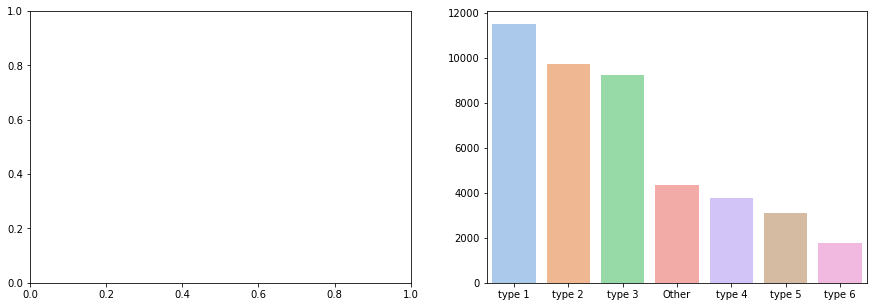

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [50]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,Vaccinate to protect yourself and your loved o...,Other,[],12
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]",37
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
4,vaccination against covid- 19 is necessity tod...,type 2,"[necessity, scenario, problem]",17


In [51]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [52]:
result = result.drop('Lemma-text', axis=1)

In [53]:
from wordcloud import WordCloud 

In [54]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

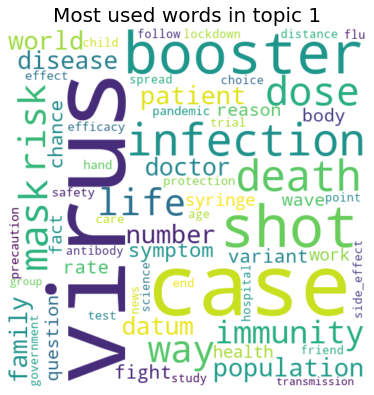

In [55]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

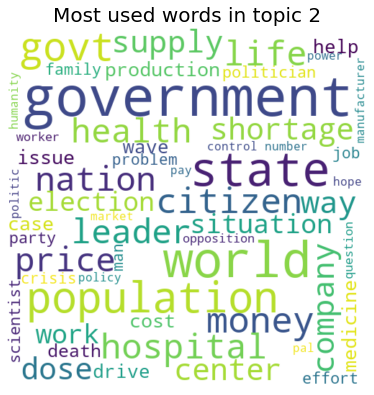

In [56]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

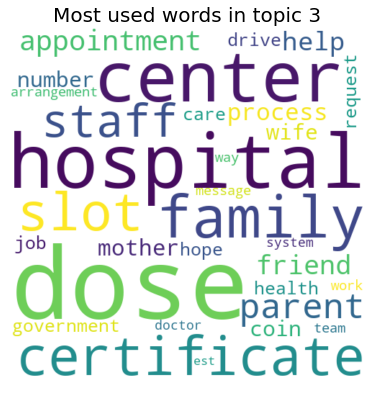

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

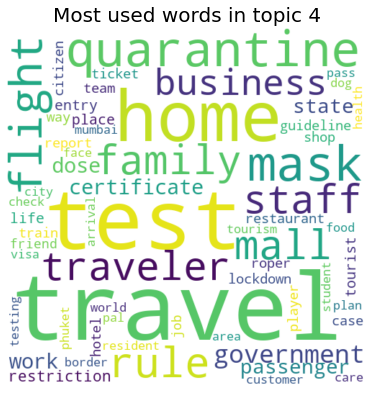

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

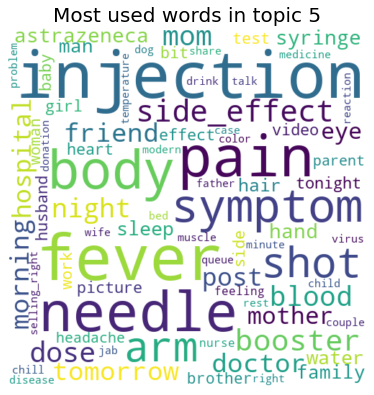

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

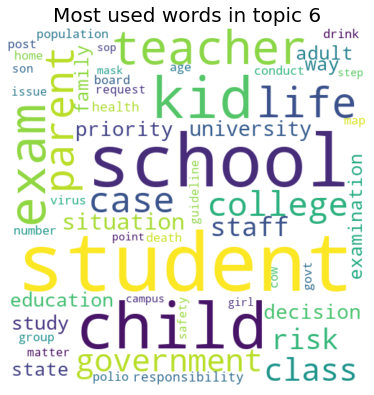

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

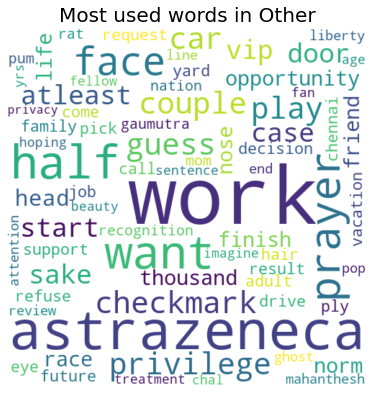

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [42]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(tokenised_lemmatized, n_terms)

In stage 0: transferred 35295 clusters with 7 clusters populated
In stage 1: transferred 29381 clusters with 7 clusters populated
In stage 2: transferred 26347 clusters with 7 clusters populated
In stage 3: transferred 23857 clusters with 7 clusters populated
In stage 4: transferred 21791 clusters with 7 clusters populated
In stage 5: transferred 20445 clusters with 7 clusters populated
In stage 6: transferred 19478 clusters with 7 clusters populated
In stage 7: transferred 18749 clusters with 7 clusters populated
In stage 8: transferred 18269 clusters with 7 clusters populated
In stage 9: transferred 17820 clusters with 7 clusters populated
In stage 10: transferred 17590 clusters with 7 clusters populated
In stage 11: transferred 17342 clusters with 7 clusters populated
In stage 12: transferred 17108 clusters with 7 clusters populated
In stage 13: transferred 16817 clusters with 7 clusters populated
In stage 14: transferred 16558 clusters with 7 clusters populated
In stage 15: transfe

In [43]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [11787 11248  2797  2400 11294  1994  1943]

Most important clusters (by number of docs inside): [0 4 1 2 3 5 6]

Cluster 0 : [('government', 806), ('world', 683), ('state', 605), ('population', 554), ('govt', 399), ('life', 380), ('hospital', 319), ('citizen', 315), ('case', 312), ('money', 309)]

Cluster 4 : [('dose', 1096), ('hospital', 682), ('center', 560), ('family', 558), ('slot', 450), ('staff', 435), ('appointment', 382), ('certificate', 371), ('parent', 367), ('help', 359)]

Cluster 1 : [('virus', 1020), ('booster', 680), ('shot', 657), ('infection', 602), ('case', 590), ('death', 470), ('dose', 460), ('symptom', 418), ('risk', 388), ('mask', 386)]

Cluster 2 : [('travel', 338), ('test', 250), ('quarantine', 172), ('flight', 131), ('traveler', 117), ('home', 110), ('passenger', 93), ('dose', 86), ('certificate', 85), ('family', 83)]

Cluster 3 : [('trial', 132), ('dose', 124), ('certificate', 115), ('datum', 111), ('photo', 94), ('video', 82), 

In [44]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [45]:
def create_topics_dataframe(data_text=df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [46]:
result = create_topics_dataframe(data_text=df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 3,[death]
1,Vaccinate to protect yourself and your loved o...,Other,[]
2,is covid ki waja se buht saray logon ne apne p...,type 2,"[hair, ply]"
3,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]"
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"


In [47]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [48]:
result['Topic']

0        type 3
1         Other
2        type 2
3        type 3
4        type 1
          ...  
43458    type 3
43459    type 1
43460    type 1
43461    type 2
43462    type 2
Name: Topic, Length: 43463, dtype: object

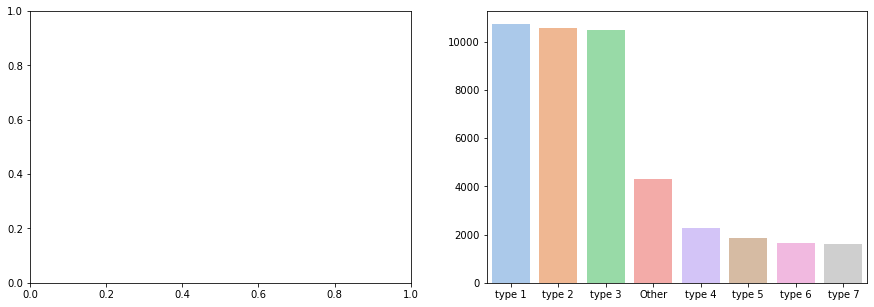

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [50]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 3,[death],25
1,Vaccinate to protect yourself and your loved o...,Other,[],12
2,is covid ki waja se buht saray logon ne apne p...,type 2,"[hair, ply]",37
3,deaths due covid what is vaccination rate what...,type 3,"[death, rate, harm, harm]",61
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17


In [51]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [52]:
result = result.drop('Lemma-text', axis=1)

In [53]:
from wordcloud import WordCloud 

In [54]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

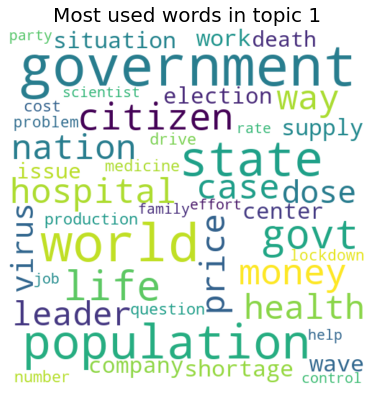

In [55]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

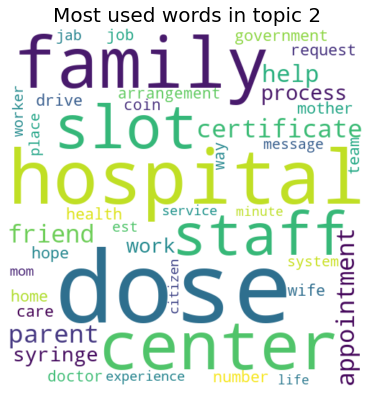

In [56]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

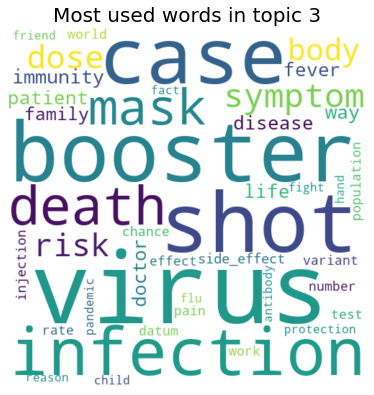

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

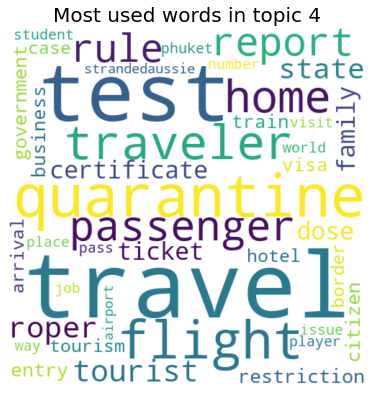

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

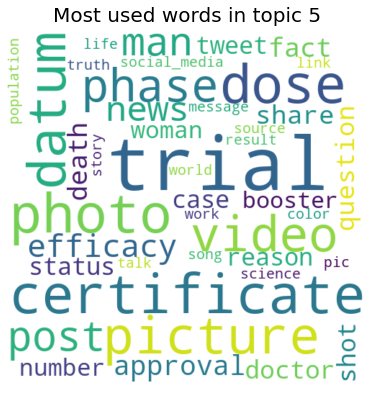

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

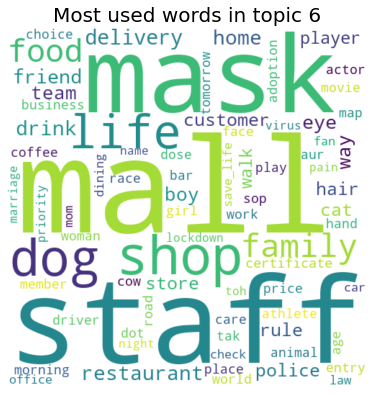

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

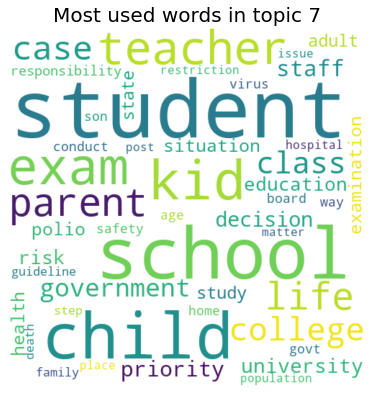

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

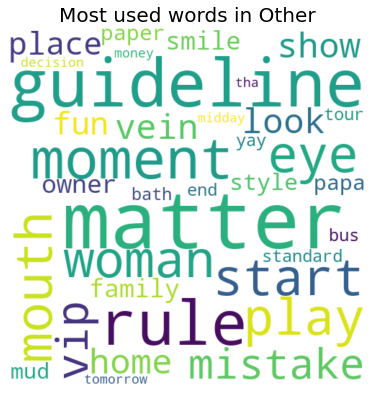

In [62]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [63]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(tokenised_lemmatized, n_terms)

In stage 0: transferred 36164 clusters with 8 clusters populated
In stage 1: transferred 30151 clusters with 8 clusters populated
In stage 2: transferred 26883 clusters with 8 clusters populated
In stage 3: transferred 24312 clusters with 8 clusters populated
In stage 4: transferred 22470 clusters with 8 clusters populated
In stage 5: transferred 20914 clusters with 8 clusters populated
In stage 6: transferred 20050 clusters with 8 clusters populated
In stage 7: transferred 19255 clusters with 8 clusters populated
In stage 8: transferred 18686 clusters with 8 clusters populated
In stage 9: transferred 18423 clusters with 8 clusters populated
In stage 10: transferred 17887 clusters with 8 clusters populated
In stage 11: transferred 17740 clusters with 8 clusters populated
In stage 12: transferred 17588 clusters with 8 clusters populated
In stage 13: transferred 17314 clusters with 8 clusters populated
In stage 14: transferred 17085 clusters with 8 clusters populated
In stage 15: transfe

In [64]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 6205  7936  2691 11171 11122   175   677  3486]

Most important clusters (by number of docs inside): [3 4 1 0 7 2 6 5]

Cluster 3 : [('government', 799), ('world', 657), ('state', 569), ('population', 464), ('govt', 377), ('citizen', 311), ('hospital', 307), ('money', 305), ('life', 302), ('price', 280)]

Cluster 4 : [('virus', 1110), ('case', 665), ('infection', 607), ('booster', 601), ('shot', 588), ('death', 546), ('dose', 528), ('mask', 439), ('risk', 380), ('life', 360)]

Cluster 1 : [('dose', 976), ('hospital', 565), ('center', 477), ('certificate', 463), ('slot', 438), ('appointment', 369), ('staff', 337), ('parent', 271), ('help', 264), ('process', 242)]

Cluster 0 : [('student', 652), ('school', 476), ('travel', 393), ('child', 329), ('test', 309), ('kid', 251), ('government', 238), ('staff', 220), ('case', 212), ('exam', 211)]

Cluster 7 : [('family', 378), ('friend', 208), ('home', 145), ('life', 144), ('mother', 124), ('blood', 120), ('chil

In [65]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [66]:
def create_topics_dataframe(data_text=df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [67]:
result = create_topics_dataframe(data_text=df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death]
1,Vaccinate to protect yourself and your loved o...,Other,[]
2,is covid ki waja se buht saray logon ne apne p...,type 5,"[hair, ply]"
3,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]"
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"


In [68]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [69]:
result['Topic']

0        type 2
1         Other
2        type 5
3        type 2
4        type 1
          ...  
43458    type 2
43459    type 5
43460    type 1
43461    type 3
43462    type 2
Name: Topic, Length: 43463, dtype: object

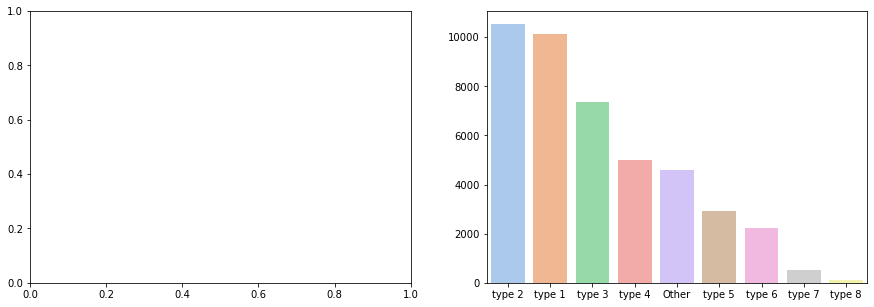

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [71]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 2,[death],25
1,Vaccinate to protect yourself and your loved o...,Other,[],12
2,is covid ki waja se buht saray logon ne apne p...,type 5,"[hair, ply]",37
3,deaths due covid what is vaccination rate what...,type 2,"[death, rate, harm, harm]",61
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17


In [72]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [73]:
result = result.drop('Lemma-text', axis=1)

In [74]:
from wordcloud import WordCloud 

In [75]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

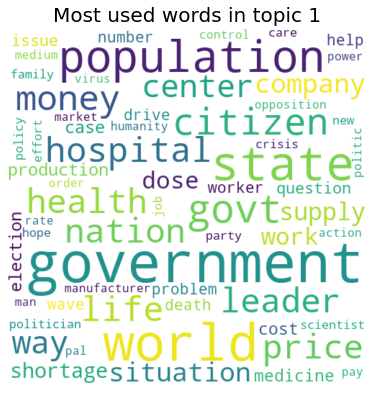

In [76]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

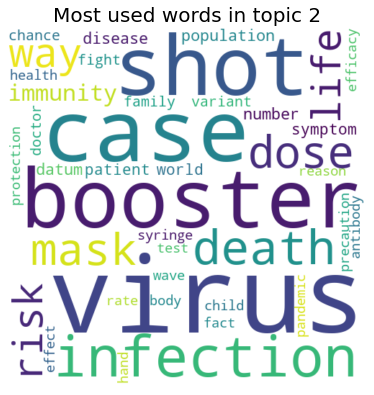

In [77]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

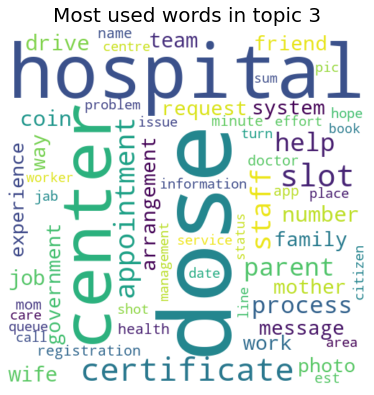

In [78]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

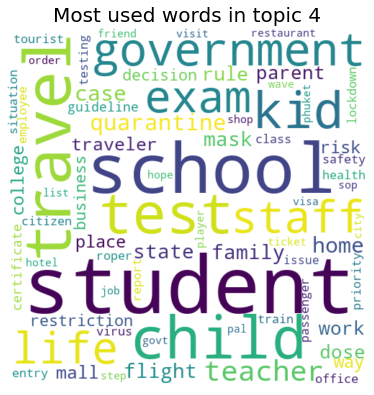

In [79]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

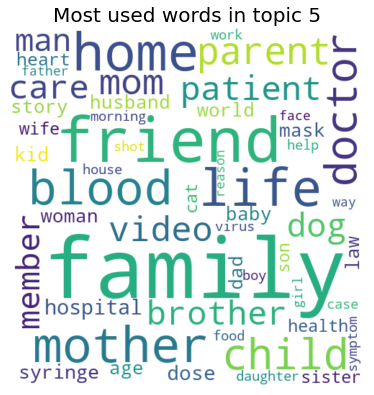

In [80]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

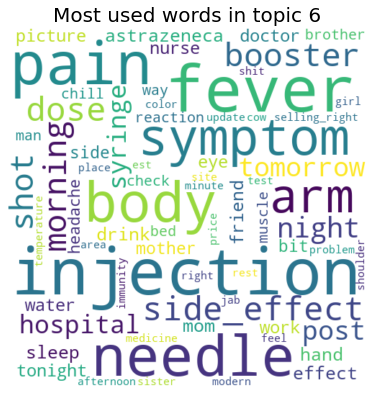

In [81]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

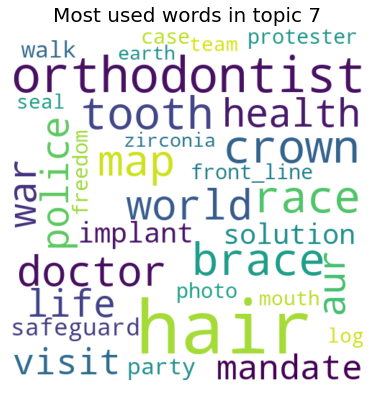

In [82]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

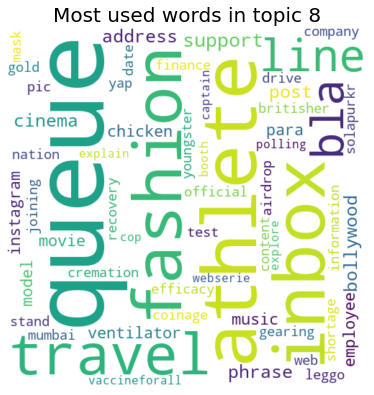

In [83]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

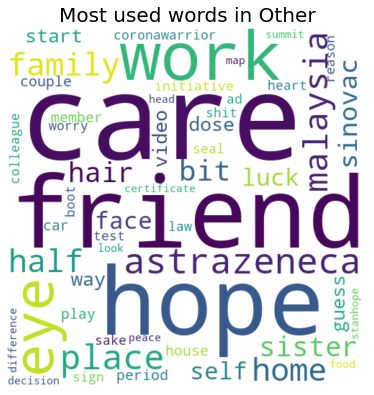

In [84]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [85]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(tokenised_lemmatized, n_terms)

In stage 0: transferred 36767 clusters with 9 clusters populated
In stage 1: transferred 30746 clusters with 9 clusters populated
In stage 2: transferred 27386 clusters with 9 clusters populated
In stage 3: transferred 24969 clusters with 9 clusters populated
In stage 4: transferred 22740 clusters with 9 clusters populated
In stage 5: transferred 21231 clusters with 9 clusters populated
In stage 6: transferred 20130 clusters with 9 clusters populated
In stage 7: transferred 19233 clusters with 9 clusters populated
In stage 8: transferred 18610 clusters with 9 clusters populated
In stage 9: transferred 18163 clusters with 9 clusters populated
In stage 10: transferred 17763 clusters with 9 clusters populated
In stage 11: transferred 17661 clusters with 9 clusters populated
In stage 12: transferred 17572 clusters with 9 clusters populated
In stage 13: transferred 17314 clusters with 9 clusters populated
In stage 14: transferred 17100 clusters with 9 clusters populated
In stage 15: transfe

In [86]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 7009  9206  1831   355  4114   349 10445  6012  4142]

Most important clusters (by number of docs inside): [6 1 0 7 8 4 2 3 5]

Cluster 6 : [('virus', 1062), ('case', 661), ('infection', 615), ('booster', 543), ('death', 540), ('shot', 525), ('dose', 456), ('mask', 440), ('risk', 401), ('way', 356)]

Cluster 1 : [('dose', 865), ('certificate', 573), ('hospital', 499), ('center', 466), ('slot', 440), ('travel', 383), ('appointment', 367), ('test', 301), ('government', 263), ('staff', 257)]

Cluster 0 : [('family', 483), ('dose', 305), ('health', 290), ('staff', 288), ('life', 274), ('drive', 257), ('government', 240), ('worker', 234), ('work', 226), ('friend', 220)]

Cluster 7 : [('government', 479), ('state', 323), ('world', 305), ('price', 278), ('money', 275), ('govt', 250), ('hospital', 201), ('life', 183), ('citizen', 183), ('leader', 170)]

Cluster 8 : [('population', 397), ('world', 255), ('government', 154), ('dose', 152), ('trial', 140), ('stat

In [87]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [88]:
def create_topics_dataframe(data_text=df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [89]:
result = create_topics_dataframe(data_text=df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,Vaccinate to protect yourself and your loved o...,Other,[]
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]"
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"


In [90]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [91]:
result['Topic']

0        type 1
1         Other
2         Other
3        type 1
4        type 1
          ...  
43458    type 1
43459    type 5
43460    type 4
43461    type 2
43462    type 1
Name: Topic, Length: 43463, dtype: object

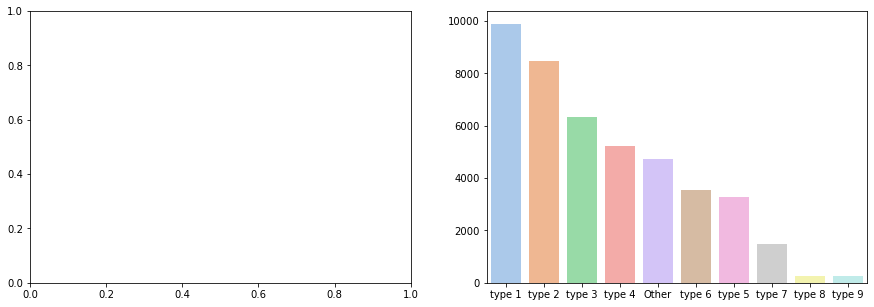

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [93]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,Vaccinate to protect yourself and your loved o...,Other,[],12
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]",37
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17


In [94]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [95]:
result = result.drop('Lemma-text', axis=1)

In [96]:
from wordcloud import WordCloud 

In [97]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

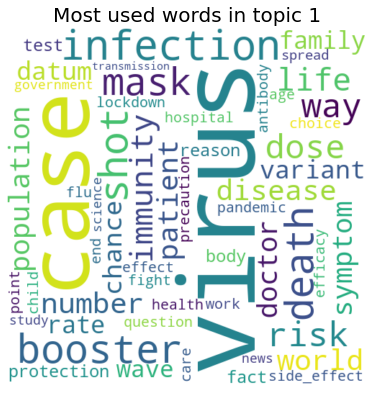

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

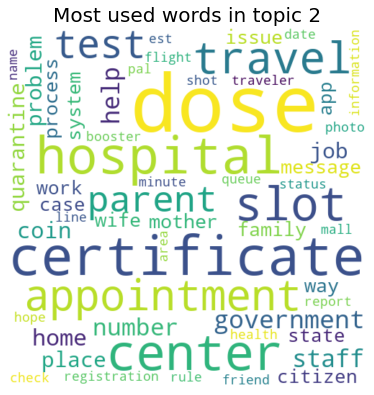

In [99]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

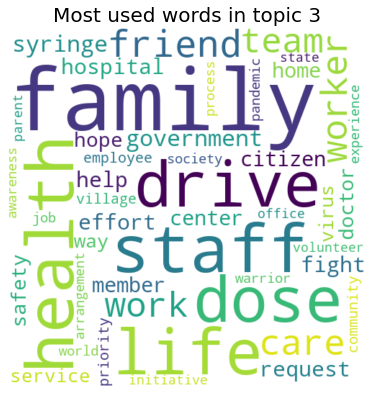

In [100]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

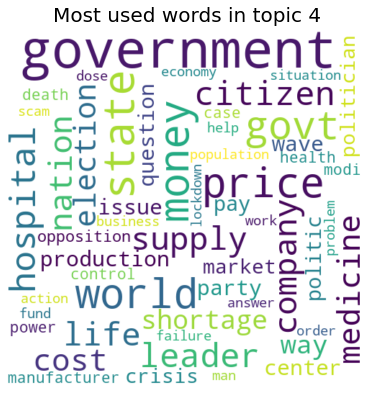

In [101]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

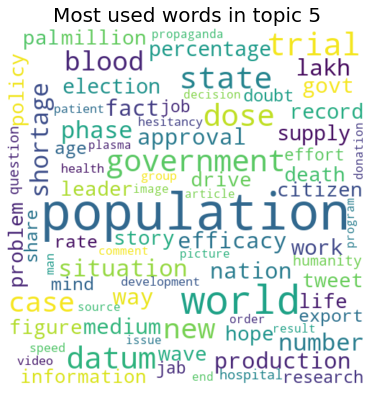

In [102]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

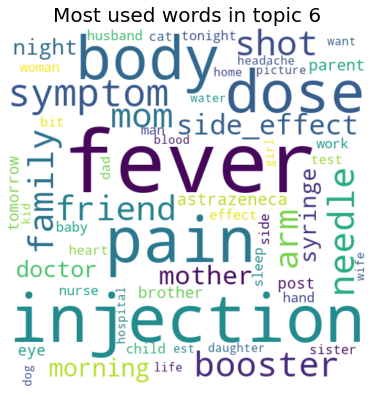

In [103]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

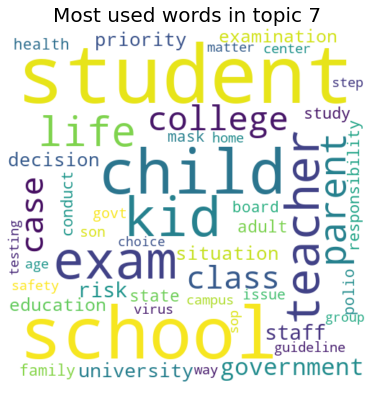

In [104]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

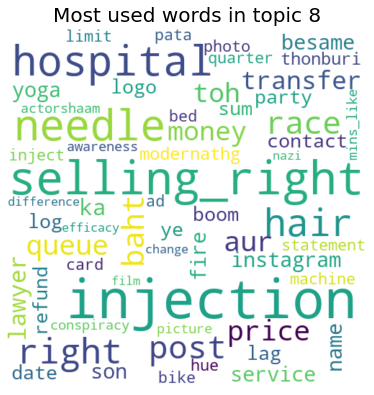

In [105]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

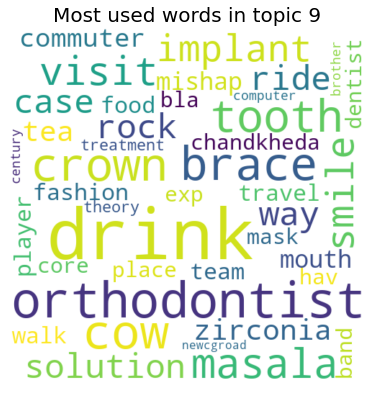

In [106]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

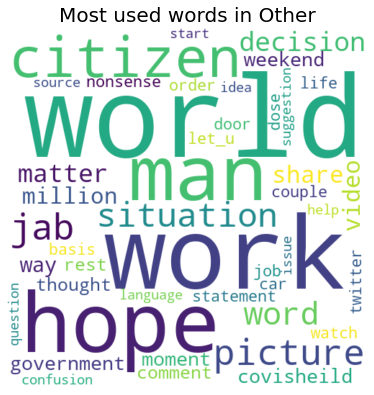

In [107]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [113]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(tokenised_lemmatized, n_terms)

In stage 0: transferred 37314 clusters with 10 clusters populated
In stage 1: transferred 31119 clusters with 10 clusters populated
In stage 2: transferred 27494 clusters with 10 clusters populated
In stage 3: transferred 24875 clusters with 10 clusters populated
In stage 4: transferred 22899 clusters with 10 clusters populated
In stage 5: transferred 21528 clusters with 10 clusters populated
In stage 6: transferred 20532 clusters with 10 clusters populated
In stage 7: transferred 19735 clusters with 10 clusters populated
In stage 8: transferred 19008 clusters with 10 clusters populated
In stage 9: transferred 18753 clusters with 10 clusters populated
In stage 10: transferred 18382 clusters with 10 clusters populated
In stage 11: transferred 18029 clusters with 10 clusters populated
In stage 12: transferred 17801 clusters with 10 clusters populated
In stage 13: transferred 17360 clusters with 10 clusters populated
In stage 14: transferred 17553 clusters with 10 clusters populated
In st

In [114]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [ 3205 10126   196  6660  2145   311  3048  8742  7487  1543]

Most important clusters (by number of docs inside): [1 7 8 3 0 6 4 9 5 2]

Cluster 1 : [('virus', 970), ('case', 652), ('infection', 606), ('booster', 586), ('shot', 573), ('death', 549), ('dose', 514), ('population', 399), ('risk', 386), ('datum', 328)]

Cluster 7 : [('government', 687), ('world', 534), ('state', 508), ('population', 378), ('govt', 320), ('money', 305), ('price', 286), ('citizen', 257), ('leader', 251), ('life', 243)]

Cluster 8 : [('family', 517), ('hospital', 456), ('dose', 440), ('staff', 409), ('center', 378), ('health', 323), ('drive', 248), ('work', 246), ('worker', 245), ('help', 230)]

Cluster 3 : [('dose', 642), ('certificate', 565), ('travel', 364), ('slot', 360), ('appointment', 296), ('test', 270), ('hospital', 268), ('center', 233), ('number', 207), ('coin', 190)]

Cluster 0 : [('mask', 432), ('home', 151), ('distance', 137), ('hand', 129), ('life', 122), ('case

In [115]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [116]:
def create_topics_dataframe(data_text=df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [117]:
result = create_topics_dataframe(data_text=df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death]
1,Vaccinate to protect yourself and your loved o...,Other,[]
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]"
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]"
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]"


In [118]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [119]:
result['Topic']

0        type 1
1         Other
2         Other
3        type 1
4        type 1
          ...  
43458    type 1
43459    type 2
43460    type 2
43461    type 3
43462    type 1
Name: Topic, Length: 43463, dtype: object

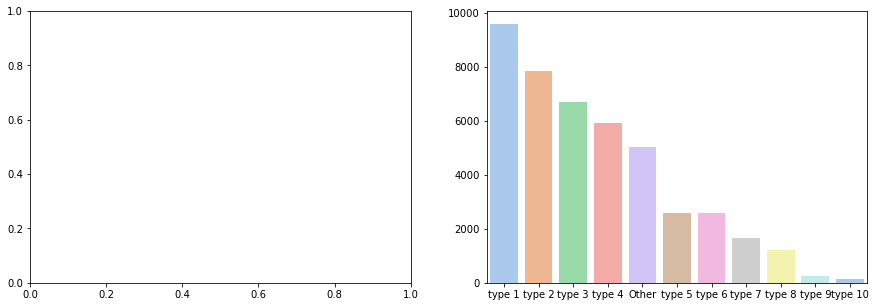

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [121]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,soniya mummy hoti toh covid me magic stick ghu...,type 1,[death],25
1,Vaccinate to protect yourself and your loved o...,Other,[],12
2,is covid ki waja se buht saray logon ne apne p...,Other,"[hair, ply]",37
3,deaths due covid what is vaccination rate what...,type 1,"[death, rate, harm, harm]",61
4,vaccination against covid- 19 is necessity tod...,type 1,"[necessity, scenario, problem]",17


In [122]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [123]:
result = result.drop('Lemma-text', axis=1)

In [124]:
from wordcloud import WordCloud 

In [125]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

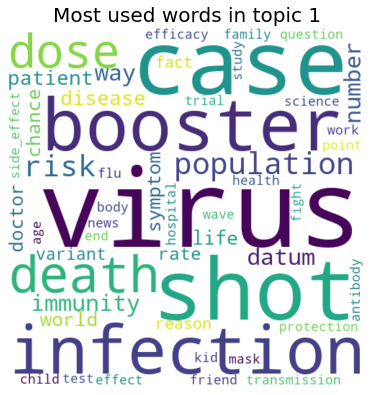

In [126]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

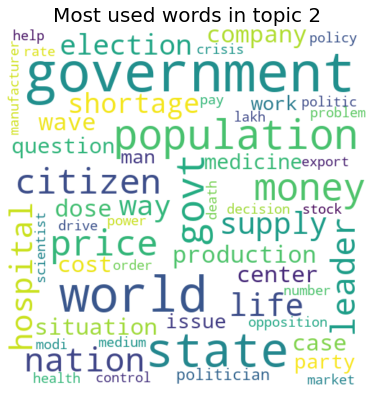

In [127]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

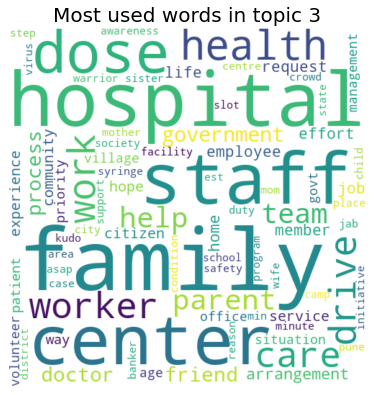

In [128]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

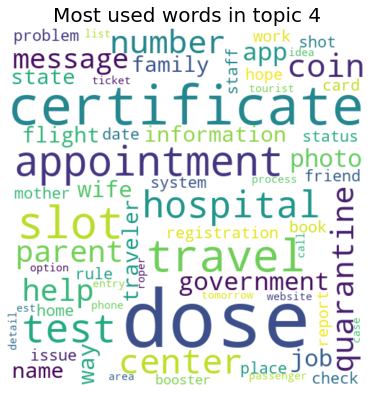

In [129]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

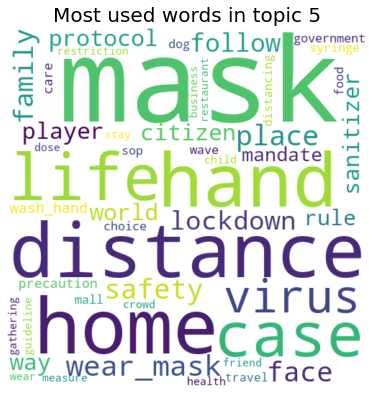

In [130]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

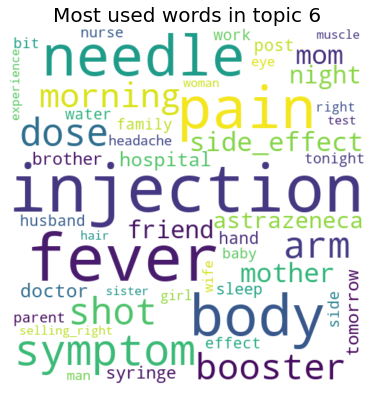

In [131]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

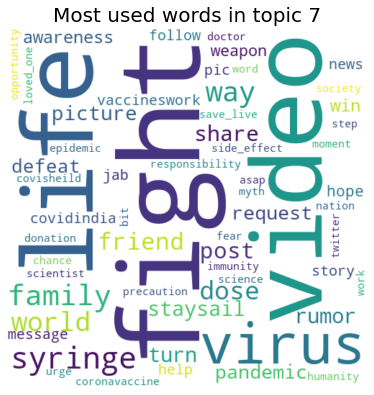

In [132]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

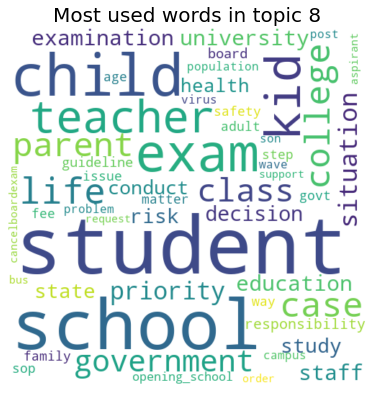

In [133]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

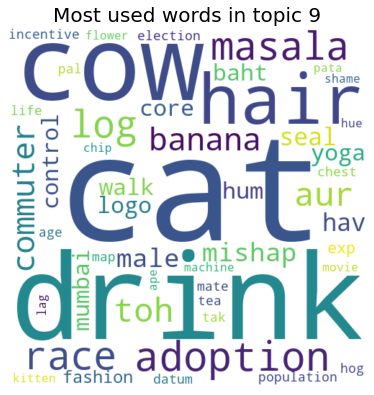

In [134]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

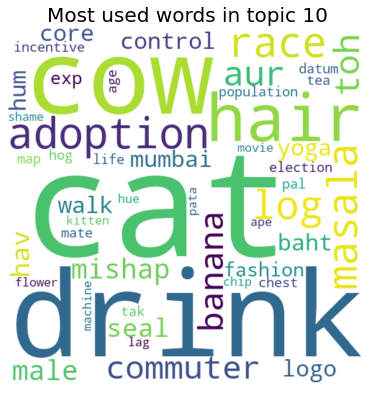

In [135]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 10")

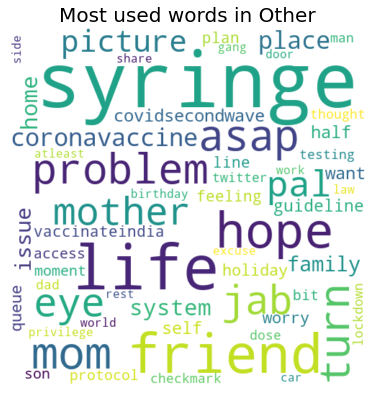

In [136]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")